In [1]:
import sys; sys.path.append('../..')
from abslithist import *

In [2]:
!ls -lh {COUNT_DIR}

total 6.1G
-rw-rw-r-- 1 ryan ryan 365M Feb 21 14:46 data.absconc.CanonFiction.csv
-rw-rw-r-- 1 ryan ryan 123M Feb 21 14:46 data.absconc.CanonFiction.ft
-rw-rw-r-- 1 ryan ryan 459M Feb 21 14:46 data.absconc.CanonFiction.psgs.v5.csv.gz
-rw-rw-r-- 1 ryan ryan 463M Feb 21 14:46 data.absconc.CanonFiction.psgs.v7.csv.gz
-rw-rw-r-- 1 ryan ryan   90 Feb 21 14:46 data.absconc.CanonFiction.v3.csv
-rw-rw-r-- 1 ryan ryan 285M Feb 21 14:46 data.absconc.CanonFiction.v3.ft
-rw-rw-r-- 1 ryan ryan 700M Feb 21 14:46 data.absconc.CanonFiction.v4.csv
-rw-rw-r-- 1 ryan ryan 319M Feb 21 14:46 data.absconc.CanonFiction.v4.ft
-rw-rw-r-- 1 ryan ryan 299M Feb 21 14:46 data.absconc.CanonFiction.v6.csv.ft
-rw-rw-r-- 1 ryan ryan 173M Feb 21 14:46 data.absconc.CanonFiction.v6.csv.gz
-rw-rw-r-- 1 ryan ryan 382M Feb 22 19:30 data.absconc.chadwyck_poetry.v7.csv.ft
-rw-rw-r-- 1 ryan ryan 168M Feb 22 19:30 data.absconc.chadwyck_poetry.v7.csv.gz
-rw-rw-r-- 1 ryan ryan 663M Feb 22 08:41 data.absconc.coha.v7.csv.ft
-rw-rw-

In [3]:
meta=lltk.load('chadwyck_poetry').metadata

In [10]:
meta[['id','year','author_dob']]

,id,year,author_dob
0,english/bartonbe/Z200274127,1814.0,1784
1,c20-american/am20129/Z300227191,1915.0,1885
2,c20-english/ep20128/Z200582770,1924.0,1894
3,english-ed2/ep2527/Z300669174,1847.0,1817
4,english/browniro/Z300289566,1842.0,1812
...,...,...,...
336174,english/merival1/Z300428527,1809.0,1779
336176,english/cowperwi/Z300323182,1761.0,1731
336177,english/colersam/Z300317557,1802.0,1772
336178,american/am0232/Z200151866,1841.0,1811


In [4]:
# meta[meta.title.str.lower().str.contains('discourse')

In [34]:
count_files = [
    # f'{COUNT_DIR}/data.absconc.chadwyck_poetry.v7.csv.ft',
    f'{COUNT_DIR}/data.absconc.ecco_tcp.v7.csv.ft',
    f'{COUNT_DIR}/data.absconc.eebo_tcp.v7.csv.ft',
    f'{COUNT_DIR}/data.absconc.coha.v7.csv.ft',
    f'{COUNT_DIR}/data.absconc.CanonFiction.v6.csv.ft',
    f'{COUNT_DIR}/data.absconc.OldBailey.v7.csv.ft',
]

In [47]:
def gen_bigdatadf(count_files=count_files,fiction_v_print=True,fiction_v_nonfiction=False):

    df=pd.DataFrame()
    for fn in count_files:
        print('>> loading:',fn)
        cdf=pd.read_feather(fn)
        cdf=cdf[set(cdf.columns) - {'abs','conc','neither'}]
        cdf['corpus']=cname=fn.split('.')[2]
        # print(fn,len(cdf))
        cdf=cdf[cdf.num_total == cdf.num_total.max()]
        # print(len(cdf))
        # print()
        meta=lltk.load(cname).metadata

        # if cname=='coha':
        #     good_ids=meta[meta.genre=='Non-Fiction'].id
        #     cdf=cdf[cdf.id.isin(good_ids)]
        #     cdf['Genre']='Non-Fiction'
        # elif cname!='CanonFiction':
        
        # or just fiction vs print?
        if fiction_v_print:
            cdf['Genre']='Fiction' if cname=='CanonFiction' else 'Print discourse'
        elif fiction_v_nonfiction:
            ## non-fiction vs fiction-->
            if cname=='coha':
                good_ids=meta[meta.genre.isin({'Non-Fiction'})].id
                cdf=cdf[cdf.id.isin(good_ids)]
                id2genre=dict(zip(meta.id,meta.genre))
                # cdf['Genre']=cdf['id'].apply(lambda x: id2genre.get(x))
                cdf['Genre']='Non-Fiction'#cdf['id'].apply(lambda x: id2genre.get(x))
            elif cname=='chadwyck_poetry':
                cdf['Genre']='Poetry'
            elif cname=='OldBailey':
                cdf['Genre']='Trial transcript'
            elif cname=='CanonFiction':
                cdf['Genre']='Fiction'
            else:
                # sep genres
                # essay_ids=set(meta[meta.title.str.contains('Essay')].id)
                # essay_ids|=set(meta[meta.title.str.contains('essay')].id)
                # treatise_ids=set(meta[meta.title.str.contains('treatise')].id)
                # treatise_ids|=set(meta[meta.title.str.contains('Treatise')].id)
                # cdf1=cdf[cdf.id.isin(essay_ids)]
                # cdf2=cdf[cdf.id.isin(treatise_ids)]
                # cdf1['Genre']='Essay'
                # cdf2['Genre']='Treatise'
                # cdf=cdf1.append(cdf2)
                
                good_ids=set()
                for keyword in ['essay','treatise','discourse']:
                    good_ids|=set(meta[meta.title.str.lower().str.contains(keyword)].id)
                cdf=cdf[cdf.id.isin(good_ids)]
                cdf['Genre']='Non-Fiction'        

        id2year=dict(zip(meta.id,meta.year))
        id2ttl=dict(zip(meta.id,meta.title))
        cdf['year']=cdf['id'].apply(lambda x: id2year.get(x))
        cdf['title']=cdf['id'].apply(lambda x: id2ttl.get(x))
        df=df.append(cdf)
    df['abs-conc']=df['num_abs']-df['num_conc']
    df['dec']=df['year'].apply(lambda y: y//5*5)
    return df

In [48]:
df=gen_bigdatadf(fiction_v_print=False, fiction_v_nonfiction=True)

>> loading: /home/ryan/github/abslithist/data/counts/data.absconc.ecco_tcp.v7.csv.ft
/home/ryan/github/abslithist/data/counts/data.absconc.ecco_tcp.v7.csv.ft 1360967
1344426

>> loading: /home/ryan/github/abslithist/data/counts/data.absconc.eebo_tcp.v7.csv.ft
/home/ryan/github/abslithist/data/counts/data.absconc.eebo_tcp.v7.csv.ft 11590803
11200998

>> loading: /home/ryan/github/abslithist/data/counts/data.absconc.coha.v7.csv.ft
/home/ryan/github/abslithist/data/counts/data.absconc.coha.v7.csv.ft 7935971
7127024

>> loading: /home/ryan/github/abslithist/data/counts/data.absconc.CanonFiction.v6.csv.ft
/home/ryan/github/abslithist/data/counts/data.absconc.CanonFiction.v6.csv.ft 3537497
3524966

>> loading: /home/ryan/github/abslithist/data/counts/data.absconc.OldBailey.v7.csv.ft
/home/ryan/github/abslithist/data/counts/data.absconc.OldBailey.v7.csv.ft 340815
336403



In [49]:
# df[(df.Genre=='Non-Fiction')]# & (df.corpus=='coha')]

In [50]:
df.num_total.min()

100

In [51]:
df.Genre

296            Non-Fiction
297            Non-Fiction
298            Non-Fiction
299            Non-Fiction
300            Non-Fiction
                ...       
340809    Trial transcript
340810    Trial transcript
340811    Trial transcript
340812    Trial transcript
340813    Trial transcript
Name: Genre, Length: 6857379, dtype: object

In [52]:
plotdf = df.groupby(['Genre','corpus','period','year']).mean().reset_index()
plotdf = plotdf[plotdf.year>=1520]#1485]
plotdf = plotdf[plotdf.period!='orig']
plotdf = plotdf.query('year>1750 | corpus!="OldBailey"')
plotdf

,Genre,corpus,period,year,num_conc,num_neither,num_types,num_abs,slice,num_total,index,abs-conc,dec
34,Fiction,CanonFiction,C16,1534,23.313043,60.612422,89.601242,16.074534,403.000000,100.0,NaN,-7.238509,1530.0
35,Fiction,CanonFiction,C16,1554,24.778846,63.038462,84.490385,12.182692,52.500000,100.0,NaN,-12.596154,1550.0
36,Fiction,CanonFiction,C16,1578,14.008230,64.312757,92.283951,21.679012,122.000000,100.0,NaN,7.670782,1575.0
37,Fiction,CanonFiction,C16,1582,22.428571,69.142857,80.714286,8.428571,4.000000,100.0,NaN,-14.000000,1580.0
38,Fiction,CanonFiction,C16,1590,19.982353,70.500000,93.376471,9.517647,85.500000,100.0,NaN,-10.464706,1590.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6622,Trial transcript,OldBailey,median,1909,16.384615,71.351648,70.395604,12.263736,478.000000,100.0,NaN,-4.120879,1905.0
6623,Trial transcript,OldBailey,median,1910,16.680387,72.631961,70.472155,10.687651,592.818402,100.0,NaN,-5.992736,1910.0
6624,Trial transcript,OldBailey,median,1911,17.272727,72.099822,71.117647,10.627451,798.130125,100.0,NaN,-6.645276,1910.0
6625,Trial transcript,OldBailey,median,1912,16.747642,71.573113,71.464623,11.679245,945.125000,100.0,NaN,-5.068396,1910.0


In [53]:
cols=['Genre','corpus','period','year','dec']
vcols=['num_abs','num_conc','num_neither','num_types']
plotdf2=pd.DataFrame()
for vcol in tqdm(vcols):
    dfx=pd.DataFrame(plotdf[cols])
    dfx['valtype']=vcol
    dfx['value']=plotdf[vcol]
    plotdf2=plotdf2.append(dfx)
plotdf2

100%|██████████| 4/4 [00:00<00:00, 281.34it/s]


,Genre,corpus,period,year,dec,valtype,value
34,Fiction,CanonFiction,C16,1534,1530.0,num_abs,16.074534
35,Fiction,CanonFiction,C16,1554,1550.0,num_abs,12.182692
36,Fiction,CanonFiction,C16,1578,1575.0,num_abs,21.679012
37,Fiction,CanonFiction,C16,1582,1580.0,num_abs,8.428571
38,Fiction,CanonFiction,C16,1590,1590.0,num_abs,9.517647
...,...,...,...,...,...,...,...
6622,Trial transcript,OldBailey,median,1909,1905.0,num_types,70.395604
6623,Trial transcript,OldBailey,median,1910,1910.0,num_types,70.472155
6624,Trial transcript,OldBailey,median,1911,1910.0,num_types,71.117647
6625,Trial transcript,OldBailey,median,1912,1910.0,num_types,71.464623


In [54]:
plotdf2.Genre.value_counts()

Non-Fiction         10320
Fiction              8088
Trial transcript     3432
Name: Genre, dtype: int64

In [55]:
# fig=p9.ggplot(p9.aes(x='dec',y='abs-conc',color='period'), data=plotdf)
# fig+=p9.geom_point(size=1,alpha=0.1)
# fig+=p9.geom_smooth(se=True,method='loess',span=0.5)
# fig+=p9.facet_wrap('Genre')
# fig

In [56]:
figdf=plotdf2[plotdf2.valtype.isin({'num_abs','num_conc','num_neither'})]
figdf=figdf[figdf.corpus!='OldBailey']
# figdf=figdf[figdf.corpus=='chadwyck_poetry']

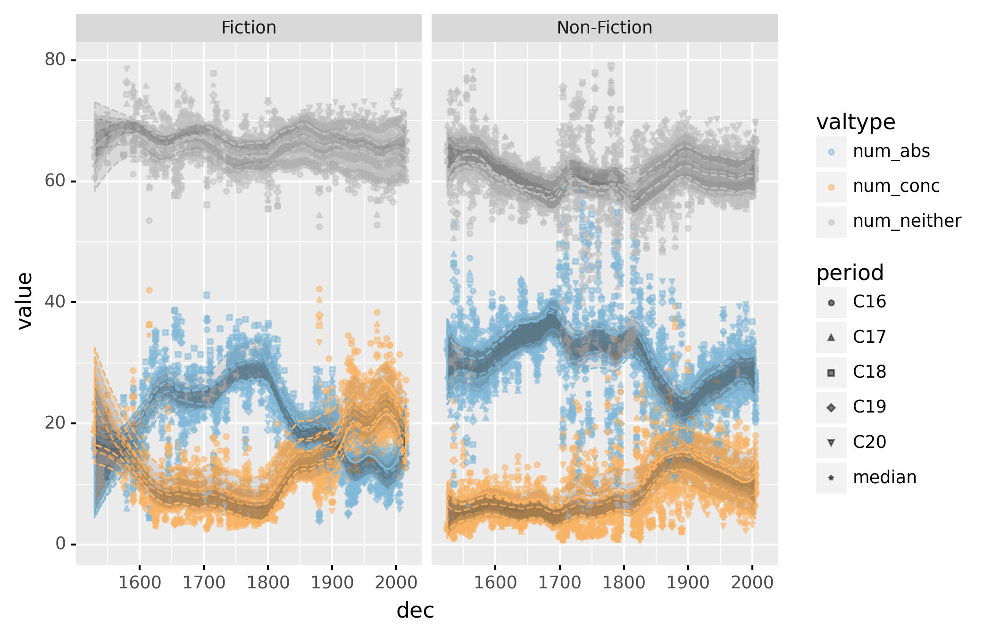

<ggplot: (8738578705973)>

In [57]:
fig=p9.ggplot(p9.aes(x='dec',y='value',color='valtype',shape='period'), data=figdf)
fig+=p9.geom_point(size=1,alpha=0.5)
# fig+=p9.geom_smooth(p9.aes(x='dec',y='value',color='valtype'),inherit_aes=False,se=True,method='loess',span=0.25)
# fig+=p9.geom_smooth(p9.aes(x='dec',y='value',color='valtype'),inherit_aes=True,se=True,method='loess',span=0.25)
fig+=p9.geom_ribbon(
    # p9.aes(x='dec',y='value',group='period'),
    # inherit_aes=False,
    stat='smooth',
    method = "loess",
    se=True,
    alpha=0.1,
    show_legend=False,
    linetype='dashed',
    span=0.2
    # color=None
)
# fig+=p9.geom_line(
#     stat="smooth",
#     method = "loess",
#     size = 1,
#     linetype ="dashed",
#     alpha = 1
# )
fig+=p9.facet_wrap('Genre')
fig+=p9.scale_color_manual({'num_abs':'#83b9d8','num_conc':'#f9b466','num_neither':'silver'})
fig.save('../../figures/fig.bigdata.fic-v-nonfic.v3.png')
fig

In [58]:
# fig=p9.ggplot(p9.aes(x='dec',y='abs-conc',color='corpus'), data=plotdf)
# fig+=p9.geom_point(size=1,alpha=0.1)
# fig+=p9.geom_smooth(se=True,method='loess',span=0.333)
# fig+=p9.facet_wrap('period')
# fig

In [15]:
def plot(key='abs-conc'):
    figdf=plotdf.query('year>=1500 & period!="orig"')
    figdf=figdf.query('year>1750 | corpus!="OldBailey"')
    fig=p9.ggplot(p9.aes(x='dec',y=key,color='Genre',shape='corpus'), data=figdf)
    fig+=p9.geom_point(size=1,alpha=0.2)
    fig+=p9.geom_smooth(p9.aes(x='dec',y=key,color='Genre'),inherit_aes=False,se=True,method='loess',span=0.25)
    return fig

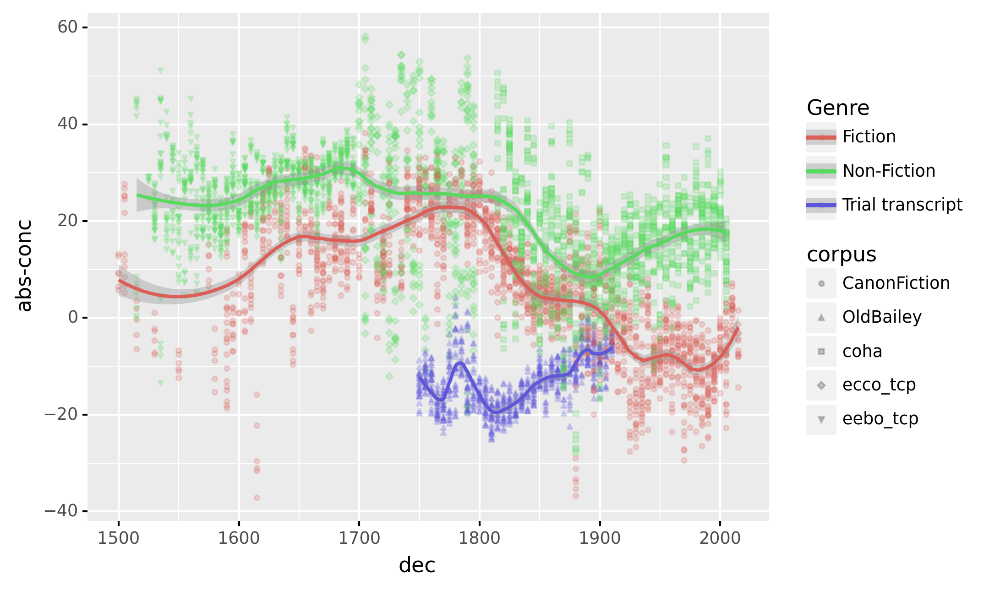

<ggplot: (8787667031677)>

In [16]:
plot('abs-conc')

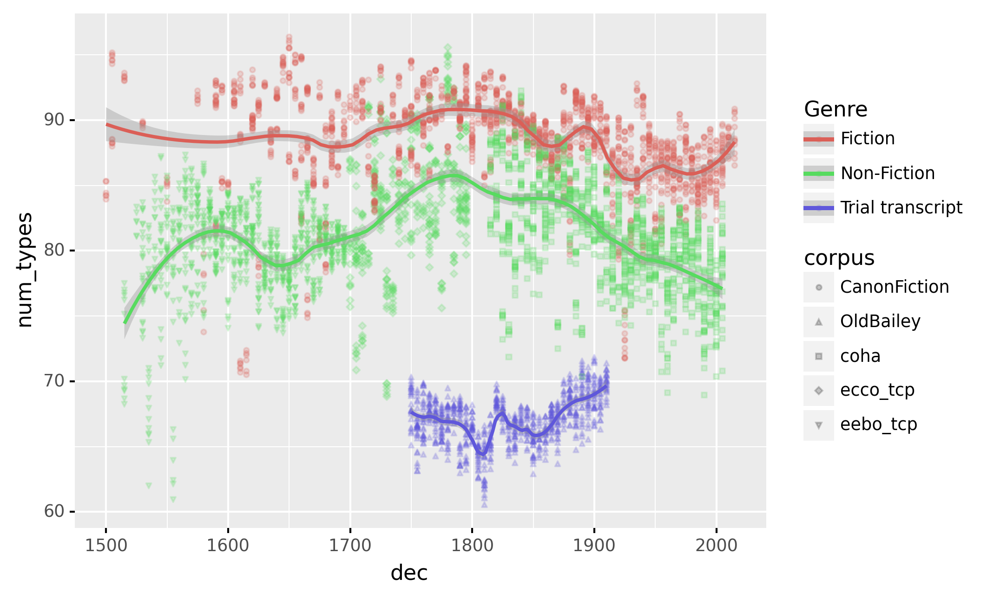

<ggplot: (8787598078417)>

In [17]:
plot('num_types')

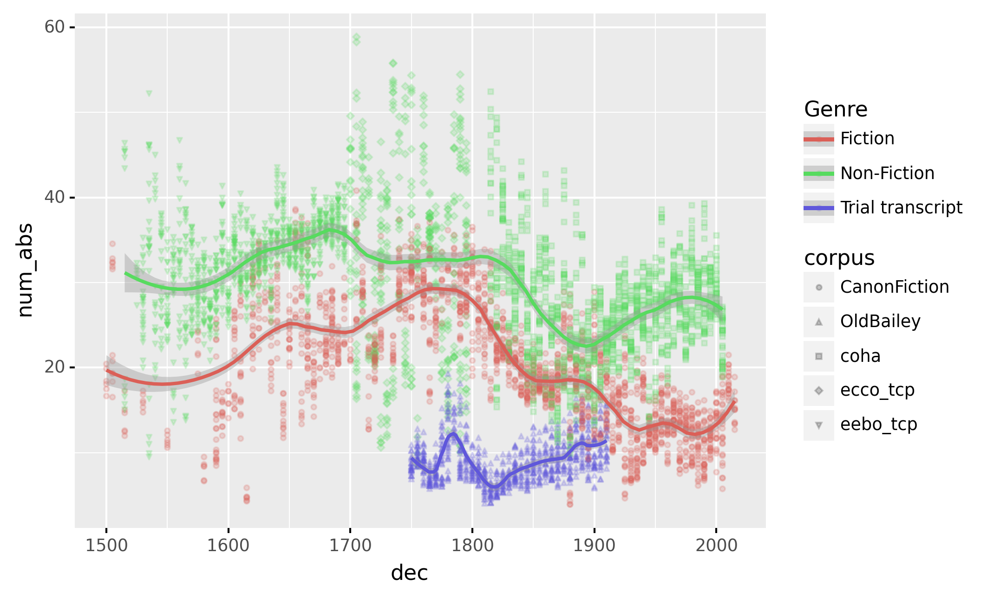

<ggplot: (8787511763973)>

In [18]:
plot('num_abs')

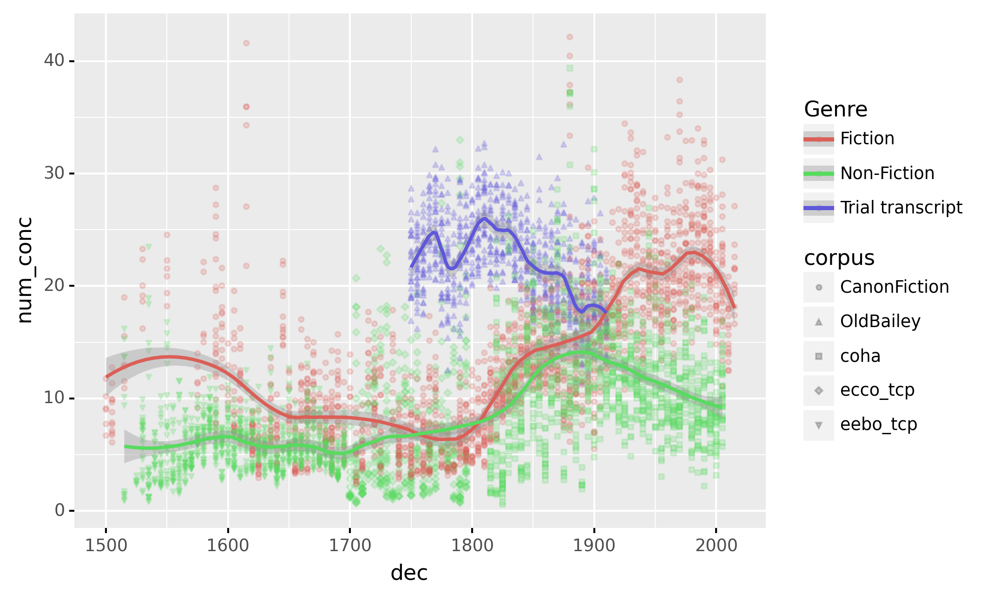

<ggplot: (8787511703325)>

In [19]:
plot('num_conc')

In [20]:
# fig=p9.ggplot(p9.aes(x='dec',y='abs-conc',color='Genre'), data=plotdf[plotdf.period!='orig'])
# fig+=p9.geom_point(size=1,alpha=0.25)
# fig+=p9.geom_smooth(se=True,method='loess',span=0.3)
# fig+=p9.facet_wrap('period')
# fig

In [21]:
# figdf=plotdf.query('period!="orig" & Genre!="Trial transcript"')
# figdf=plotdf.query('Genre!="Trial transcript"')
# fig=p9.ggplot(p9.aes(x='dec',y='abs-conc',color='period',shape='corpus'), data=figdf)
# fig+=p9.geom_point(size=1,alpha=0.25)
# fig+=p9.geom_smooth(p9.aes(x='year',y='abs-conc',group='period',color='period'),inherit_aes=False,se=True,method='loess',span=0.25,alpha=0.5)
# fig+=p9.facet_wrap('Genre')
# fig

In [22]:
# fig=p9.ggplot(p9.aes(x='dec',y='abs-conc',color='corpus'), data=plotdf)#[plotdf.period!='orig'])
# fig+=p9.geom_point(size=1,alpha=0.1)
# fig+=p9.geom_smooth(se=True,method='loess',span=0.9)
# fig+=p9.facet_wrap('period')
# fig